## Feature Visualization Video Demo notebook

In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
#hardware
device = 'cuda:0'

from circuit_pruner.utils import load_config

config = load_config('./configs/alexnet_sparse_config.py')
model = config.model.to(device)



#general
import torch
import os
from copy import deepcopy


/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


#### feature target 

In [9]:
#circle feature
layer = 'features_6'
unit = 305

feature_targets = {layer:[unit]}

100%|██████████| 100/100 [00:01<00:00, 97.33it/s]



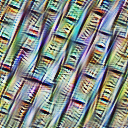

not


In [8]:
from lucent_video.optvis import render, param, transform, objectives

obj = layer+':'+str(unit)
_ = render.render_vis(model, obj, show_inline=True, thresholds = (100,))

#### ranks

In [10]:
#general_ranks = torch.load('quick_start/features_8_53_alexnetsparse_actgrad_ranks.pt')
ranks_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner/circuit_ranks/alexnet_sparse/imagenet_2/actxgrad/'
general_ranks = torch.load(ranks_folder+'alexnet_sparse_features_6:305_1640670785.5266242.pt')
from circuit_pruner.ranks import rankdict_2_ranklist
general_ranks = rankdict_2_ranklist(general_ranks)

In [11]:
import pickle
df = pickle.load(open('quick_start/dist_df.pkl','rb'))

In [12]:
df.loc[(df['model']=='alexnet_sparse') & (df['layer']==layer) & (df['method']=='actxgrad') & (df['unit']==unit)][['sparsity','effective_sparsity','pruned_pearson']]

,sparsity,effective_sparsity,pruned_pearson
37289,0.001,0.000000,0.000000
37290,0.005,0.000000,0.000000
37291,0.010,0.002683,0.583387
37292,0.050,0.042456,0.935519
37293,0.100,0.094697,0.980296
37294,0.200,0.199100,0.995835
37295,0.300,0.299321,0.999076
37296,0.400,0.398674,0.999909
37297,0.500,0.496449,0.999999
37298,0.600,0.598564,1.000000


#### sparsity

In [13]:
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
setup_net_for_circuit_prune(model)

In [16]:
sparsity = .01

In [17]:
nonzero_ranks = 0 

for r in general_ranks:
    nonzero_ranks += torch.sum((r != 0).int())
    

In [18]:
k = int(nonzero_ranks*sparsity)
k

126

#### mask

In [11]:
from circuit_pruner.force import mask_from_sparsity, expand_structured_mask, apply_mask

mask,cum_sal = mask_from_sparsity(general_ranks,k)
expanded_mask = expand_structured_mask(mask,model)
apply_mask(model,expanded_mask)

### visualization

In [12]:
import numpy as np

sparsities = np.linspace(.01,.05, 50)

In [138]:
from lucent_video.optvis import render, param, transform, objectives


In [13]:
obj_c = objectives.channel(layer, unit)
obj_n = objectives.neuron(layer,  unit)

In [19]:
obj_c.description.replace(' ','_').replace('[','').replace(']','').replace(',','')

'Channel_features_6_305_None'

100%|██████████| 50/50 [00:00<00:00, 57.60it/s]



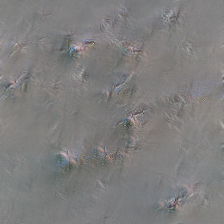

100%|██████████| 50/50 [00:00<00:00, 53.90it/s]



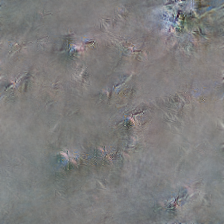

100%|██████████| 50/50 [00:00<00:00, 53.14it/s]



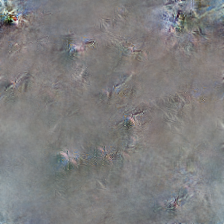

100%|██████████| 50/50 [00:00<00:00, 53.78it/s]



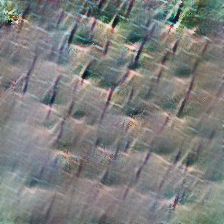

100%|██████████| 50/50 [00:00<00:00, 52.60it/s]



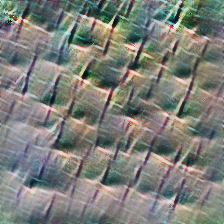

100%|██████████| 50/50 [00:00<00:00, 57.52it/s]



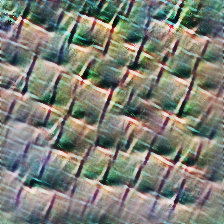

100%|██████████| 50/50 [00:00<00:00, 59.53it/s]



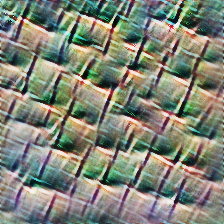

100%|██████████| 50/50 [00:00<00:00, 58.91it/s]



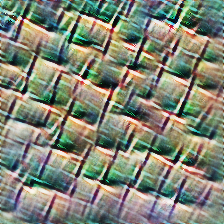

100%|██████████| 50/50 [00:00<00:00, 56.93it/s]



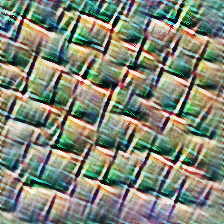

100%|██████████| 50/50 [00:00<00:00, 56.98it/s]



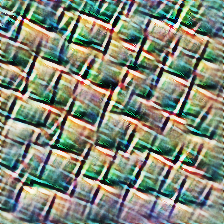

100%|██████████| 50/50 [00:00<00:00, 57.99it/s]



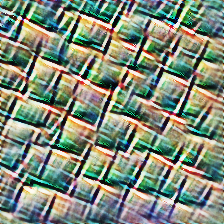

100%|██████████| 50/50 [00:01<00:00, 48.82it/s]



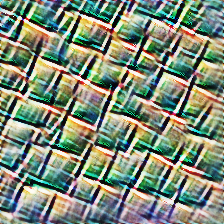

100%|██████████| 50/50 [00:01<00:00, 49.32it/s]



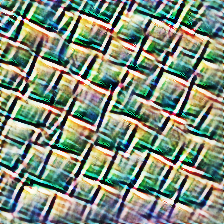

100%|██████████| 50/50 [00:00<00:00, 50.80it/s]



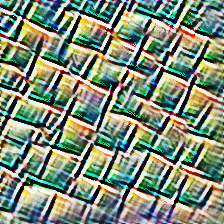

100%|██████████| 50/50 [00:01<00:00, 49.09it/s]



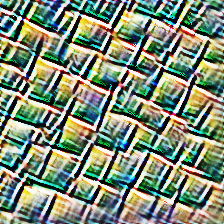

100%|██████████| 50/50 [00:01<00:00, 48.65it/s]



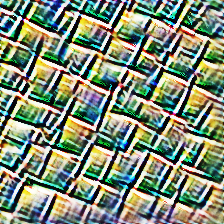

100%|██████████| 50/50 [00:00<00:00, 56.77it/s]



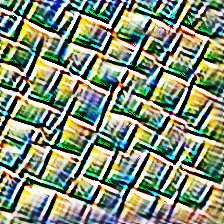

100%|██████████| 50/50 [00:01<00:00, 49.14it/s]



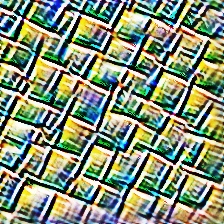

100%|██████████| 50/50 [00:01<00:00, 49.18it/s]



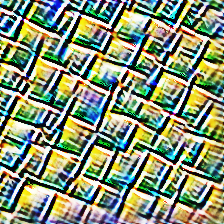

100%|██████████| 50/50 [00:00<00:00, 52.28it/s]



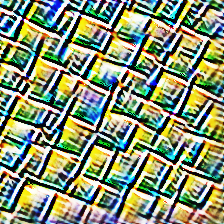

100%|██████████| 50/50 [00:00<00:00, 50.62it/s]



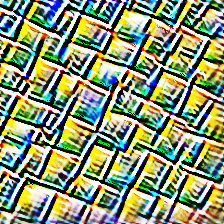

100%|██████████| 50/50 [00:00<00:00, 50.35it/s]



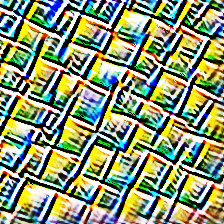

100%|██████████| 50/50 [00:00<00:00, 51.90it/s]



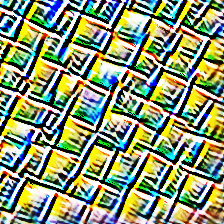

100%|██████████| 50/50 [00:00<00:00, 52.00it/s]



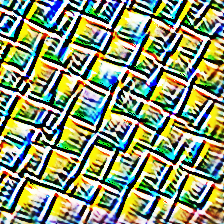

100%|██████████| 50/50 [00:00<00:00, 50.85it/s]



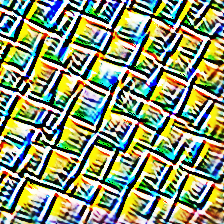

100%|██████████| 50/50 [00:01<00:00, 49.90it/s]



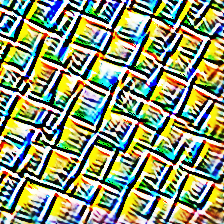

100%|██████████| 50/50 [00:01<00:00, 48.29it/s]



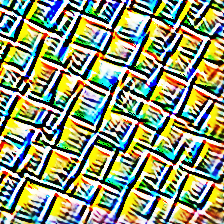

100%|██████████| 50/50 [00:01<00:00, 49.15it/s]



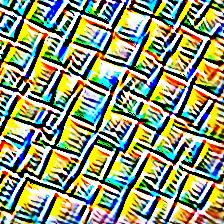

100%|██████████| 50/50 [00:01<00:00, 48.19it/s]



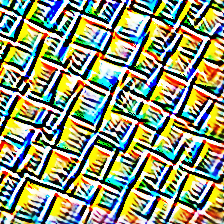

100%|██████████| 50/50 [00:01<00:00, 48.78it/s]



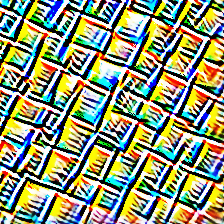

100%|██████████| 50/50 [00:01<00:00, 48.14it/s]



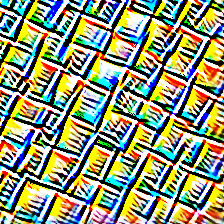

100%|██████████| 50/50 [00:01<00:00, 49.24it/s]



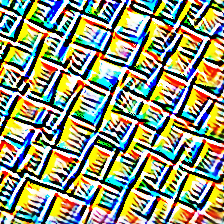

100%|██████████| 50/50 [00:00<00:00, 50.73it/s]



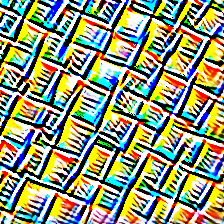

100%|██████████| 50/50 [00:00<00:00, 51.04it/s]



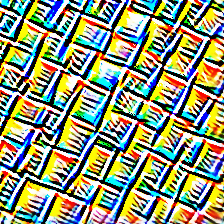

100%|██████████| 50/50 [00:00<00:00, 50.93it/s]



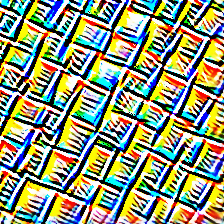

100%|██████████| 50/50 [00:00<00:00, 50.28it/s]



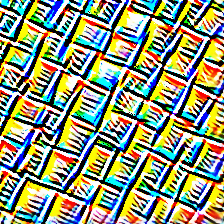

100%|██████████| 50/50 [00:01<00:00, 47.27it/s]



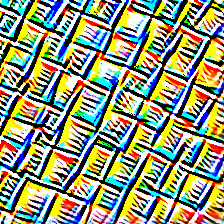

100%|██████████| 50/50 [00:01<00:00, 48.76it/s]



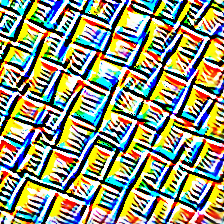

100%|██████████| 50/50 [00:01<00:00, 47.95it/s]



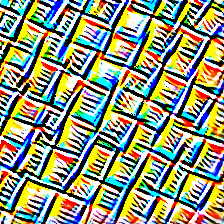

100%|██████████| 50/50 [00:01<00:00, 47.20it/s]



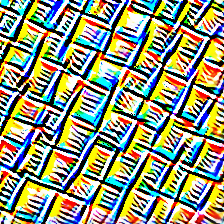

100%|██████████| 50/50 [00:01<00:00, 47.68it/s]



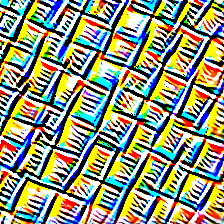

100%|██████████| 50/50 [00:01<00:00, 47.10it/s]



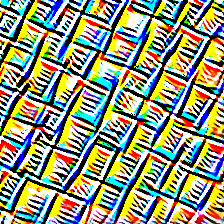

100%|██████████| 50/50 [00:01<00:00, 47.17it/s]



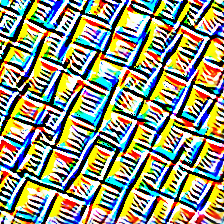

100%|██████████| 50/50 [00:01<00:00, 47.80it/s]



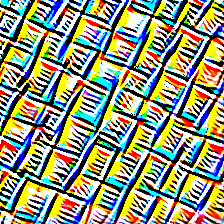

100%|██████████| 50/50 [00:01<00:00, 46.54it/s]



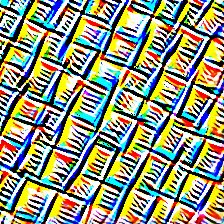

100%|██████████| 50/50 [00:01<00:00, 47.59it/s]



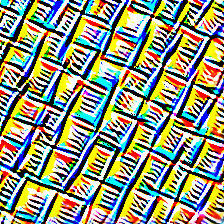

100%|██████████| 50/50 [00:01<00:00, 48.28it/s]



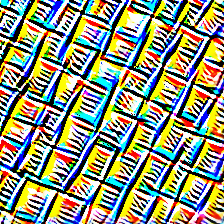

100%|██████████| 50/50 [00:01<00:00, 47.14it/s]



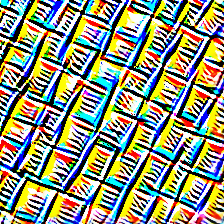

100%|██████████| 50/50 [00:01<00:00, 47.03it/s]



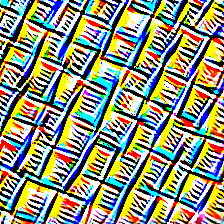

100%|██████████| 50/50 [00:01<00:00, 47.56it/s]



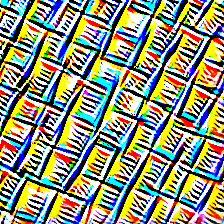

In [140]:
from lucent_video.optvis import render, param, transform, objectives

#param_f = lambda: param.image(size)

total_viz_steps = 50
within_viz_steps = 10

image_list = []
params = None
for i in range(len(sparsities)):
    sparsity = sparsities[i]
    nonzero_ranks = 0 
    for r in general_ranks:
        nonzero_ranks += torch.sum((r != 0).int())
    k = int(nonzero_ranks*sparsity)
    mask,cum_sal = mask_from_sparsity(general_ranks,k)
    expanded_mask = expand_structured_mask(mask,model)
    apply_mask(model,expanded_mask)
    
    param_f = lambda: param.image(224,start_params=params,magic=10)
    #param_f = lambda: param.image(224)
    image,params = render.render_vis(model, obj_c, param_f, show_inline=True, thresholds=(total_viz_steps,),return_params=True)
    image_list.append(image)



In [49]:
from math import ceil,exp,log,e
import numpy as np

sparsity_range = (.001,.6)

frames = 200

base=1.2

ks = []
max_k = int(nonzero_ranks*sparsity_range[1])
min_k = int(nonzero_ranks*sparsity_range[0])
for t in range(0,frames+1):
    k = ceil(base**(t/frames*log(min_k,base)+(1-t/frames)*log(max_k,base))) #exponential schedulr
    ks.insert(0, k) 
    
ks2 = []   
sparsities = np.linspace(sparsity_range[0],sparsity_range[1],frames)
for sparsity in sparsities:
    ks2.append(int(nonzero_ranks*sparsity))

In [50]:
ks

[12,
 13,
 13,
 14,
 14,
 15,
 15,
 16,
 16,
 17,
 17,
 18,
 18,
 19,
 19,
 20,
 21,
 21,
 22,
 23,
 23,
 24,
 25,
 26,
 27,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 38,
 39,
 40,
 41,
 43,
 44,
 46,
 47,
 49,
 50,
 52,
 53,
 55,
 57,
 59,
 61,
 63,
 65,
 67,
 69,
 71,
 74,
 76,
 78,
 81,
 84,
 86,
 89,
 92,
 95,
 98,
 101,
 105,
 108,
 112,
 115,
 119,
 123,
 127,
 131,
 135,
 140,
 144,
 149,
 154,
 159,
 164,
 170,
 175,
 181,
 187,
 193,
 199,
 206,
 212,
 219,
 226,
 234,
 242,
 249,
 258,
 266,
 275,
 284,
 293,
 303,
 312,
 323,
 333,
 344,
 355,
 367,
 379,
 391,
 404,
 418,
 431,
 445,
 460,
 475,
 491,
 507,
 523,
 540,
 558,
 576,
 595,
 615,
 635,
 656,
 677,
 699,
 722,
 746,
 770,
 795,
 822,
 848,
 876,
 905,
 935,
 965,
 997,
 1030,
 1063,
 1098,
 1134,
 1171,
 1210,
 1249,
 1290,
 1332,
 1376,
 1421,
 1468,
 1516,
 1566,
 1617,
 1670,
 1725,
 1781,
 1840,
 1900,
 1962,
 2026,
 2093,
 2161,
 2232,
 2305,
 2381,
 2459,
 2540,
 2623,
 2709,
 2798,
 2889,
 2984,


In [44]:
max_k

7603

In [27]:
ks2

[12,
 50,
 88,
 127,
 165,
 203,
 241,
 279,
 317,
 355,
 394,
 432,
 470,
 508,
 546,
 584,
 622,
 661,
 699,
 737,
 775,
 813,
 851,
 889,
 928,
 966,
 1004,
 1042,
 1080,
 1118,
 1156,
 1195,
 1233,
 1271,
 1309,
 1347,
 1385,
 1423,
 1462,
 1500,
 1538,
 1576,
 1614,
 1652,
 1690,
 1729,
 1767,
 1805,
 1843,
 1881,
 1919,
 1957,
 1996,
 2034,
 2072,
 2110,
 2148,
 2186,
 2224,
 2263,
 2301,
 2339,
 2377,
 2415,
 2453,
 2491,
 2530,
 2568,
 2606,
 2644,
 2682,
 2720,
 2758,
 2797,
 2835,
 2873,
 2911,
 2949,
 2987,
 3025,
 3064,
 3102,
 3140,
 3178,
 3216,
 3254,
 3293,
 3331,
 3369,
 3407,
 3445,
 3483,
 3521,
 3560,
 3598,
 3636,
 3674,
 3712,
 3750,
 3788,
 3827,
 3865,
 3903,
 3941,
 3979,
 4017,
 4055,
 4094,
 4132,
 4170,
 4208,
 4246,
 4284,
 4322,
 4361,
 4399,
 4437,
 4475,
 4513,
 4551,
 4589,
 4628,
 4666,
 4704,
 4742,
 4780,
 4818,
 4856,
 4895,
 4933,
 4971,
 5009,
 5047,
 5085,
 5123,
 5162,
 5200,
 5238,
 5276,
 5314,
 5352,
 5390,
 5429,
 5467,
 5505,
 5543,
 5581,


#### start here

In [1]:
from lucent_video.optvis import render, param, transform, objectives
from PIL import Image
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
from circuit_pruner.force import mask_from_sparsity, expand_structured_mask, apply_mask
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
from collections import OrderedDict

import numpy as np
from math import ceil,exp,log



def gen_feature_viz_video(model,ranks,layer,unit,
                          sparsities = None,sparsity_range = (.001,.6), frames=200,
                          scheduler='linear',connected=True,opt_steps=50,lr = 5e-2,size=224,
                          desaturation=10,file_name=None,save=True, negatives=False, include_full= True):
    if negatives:
        batch_size=4
        obj = objectives.channel(layer, unit, batch=0) + objectives.neuron(layer, unit, batch=1) - objectives.channel(layer, unit, batch=2) - objectives.neuron(layer, unit, batch=3)
    else:
        batch_size=2
        obj = objectives.channel(layer, unit, batch=0) + objectives.neuron(layer, unit, batch=1)
    setup_net_for_circuit_prune(model)
    image_list = []
    params = None
    opt = lambda params: torch.optim.Adam(params, lr)
    
    
    
    nonzero_ranks = 0 
    for r in ranks:
        nonzero_ranks += torch.sum((r != 0).int())
    ks = []
    
    
    if sparsities is None:
        if scheduler == 'exp':

            max_k = int(nonzero_ranks*sparsity_range[1])
            min_k = int(nonzero_ranks*sparsity_range[0])
            for t in range(0,frames+1):
                k = ceil(exp(t/frames*log(min_k)+(1-t/frames)*log(max_k))) #exponential schedulr
                ks.insert(0, k) 
            ks = list(OrderedDict.fromkeys(ks))
        else:
            sparsities = np.linspace(sparsity_range[0],sparsity_range[1],frames)
            for sparsity in sparsities:
                ks.append(int(nonzero_ranks*sparsity))
    else:
        for sparsity in sparsities:
            ks.append(int(nonzero_ranks*sparsity))
            
    #include_full
    if include_full and ks[-1] < nonzero_ranks:
        ks.append(nonzero_ranks)
        

    print(ks)
    for k in ks:
        print(k)
        mask,cum_sal = mask_from_sparsity(ranks,k)
        expanded_mask = expand_structured_mask(mask,model)
        apply_mask(model,expanded_mask)
        if connected:
            if params is not None:
                params = params.requires_grad_(False)
                ##add noise
                #param_noise, _ = param.fft_image((1, 3, size, size),sd=.01)
                #param_noise = param_noise[0].requires_grad_(False)
                #params = param_noise+params
                
                #desaturate
                params = (params-torch.mean(params))/torch.std(params)*.05
                
                
                ##remove high frequency 
                #params[:,:,:,10:,:] = 0
                
                params = params.requires_grad_(True)
                

            param_f = lambda: param.image(size,start_params=params,magic=desaturation,batch=batch_size)
        else:
            param_f = lambda: param.image(size,batch=batch_size)
        image,params = render.render_vis(model, obj, param_f, opt, show_inline=True, thresholds=(opt_steps,),return_params=True)
        image_list.append(image[0])
        
        #include full
        if include_full and (k ==ks[-1]):
            for _ in range(5):
                image_list.append(image[0])
        
        
    

    #reshape
    for i in range(len(image_list)):
        im = image_list[i]
        if im.shape[0] > 1:
            image_list[i] = np.concatenate(tuple(im),axis=1)

    gif = []
    for image in image_list:
        im = Image.fromarray(np.uint8(image*255))
        gif.append(im)
       
    if file_name is None:
        connected_name = ''
        if connected:
            connected_name = 'connected'
            file_name = '%s_%s_%s_paint.gif'%(layer,unit,connected_name)
        
    if save:
        print('saving gif to %s'%file_name)
        gif[0].save(file_name, save_all=True,optimize=False, append_images=gif[1:], loop=0)
    
    return image_list

In [2]:
import torch

#hardware
device = 'cuda:0'

from circuit_pruner.utils import load_config

config = load_config('./configs/alexnet_sparse_config.py')
model = config.model.to(device)


layer = 'features_10'
unit = 230
objective = layer+':'+str(unit)

#general_ranks = torch.load('quick_start/features_8_53_alexnetsparse_actgrad_ranks.pt')
ranks_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner/circuit_ranks/alexnet_sparse/imagenet_2/actxgrad/'
ranks = torch.load(ranks_folder+'alexnet_sparse_features_10:230_1640663121.3699417.pt')
from circuit_pruner.ranks import rankdict_2_ranklist
ranks = rankdict_2_ranklist(ranks)




/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [39]:
import pickle
df = pickle.load(open('quick_start/dist_df.pkl','rb'))
#df = pickle.load(open('extracted_circuits/circuit_with_force_and_mag_df.pkl','rb'))


df.loc[(df['model']=='alexnet_sparse') & (df['layer']==layer) & (df['method']=='actxgrad') & (df['unit']==unit)][['sparsity','effective_sparsity','pruned_pearson']]

,sparsity,effective_sparsity,pruned_pearson
30345,0.001,0.000038,0.140443
30346,0.005,0.001234,-0.041033
30347,0.010,0.004719,0.324487
30348,0.050,0.046253,0.524291
30349,0.100,0.098973,0.533153
30350,0.200,0.199824,0.878846
30351,0.300,0.299971,0.978975
30352,0.400,0.399972,0.997836
30353,0.500,0.499821,0.999969
30354,0.600,0.599812,0.999999


In [40]:
len(df.loc[(df['model']=='alexnet_sparse') & (df['method']=='actxgrad') & (df['sparsity']==.2)])

896

In [16]:
selection = df.loc[(df['model']=='alexnet_sparse') & (df['layer']==layer) & (df['method']=='actxgrad') & (df['unit']==unit)]

sparsities = list(selection['sparsity'])
scores = list(selection['pruned_pearson'])

In [23]:
thresh = .9

for i in range(len(scores)):
    if scores[i] > thresh:
        upper = scores[i]
        under = scores[i-1]
        upper_i = sparsities[i]
        under_i = sparsities[i-1]
        sparsity = (thresh - under)*(upper_i-under_i)/(upper-under)+under_i
        break

In [24]:
print(upper)
print(under)
print(upper_i)
print(under_i)

sparsity

0.9789753822634164
0.8788461758591753
0.3
0.2


0.22112652731454055

100%|██████████| 100/100 [00:01<00:00, 65.38it/s]



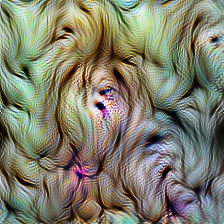

In [4]:
from lucent_video.optvis import render, param, transform, objectives

param_f = lambda: param.image(224)
#obj = layer+':'+str(unit)
obj = objectives.channel(layer,unit)
_ = render.render_vis(model, obj, param_f, show_inline=True, thresholds = (100,))

  5%|▌         | 5/100 [00:00<00:02, 42.90it/s]

[184, 9376, 18569, 27761, 36953]
184


100%|██████████| 100/100 [00:02<00:00, 44.26it/s]



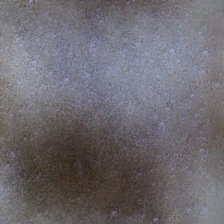
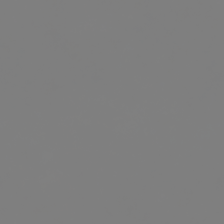

  5%|▌         | 5/100 [00:00<00:02, 42.84it/s]

9376


100%|██████████| 100/100 [00:02<00:00, 43.21it/s]



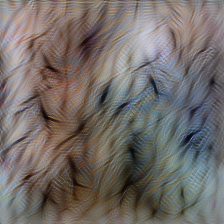
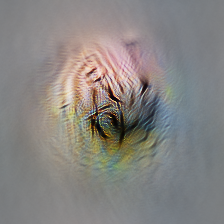

  5%|▌         | 5/100 [00:00<00:02, 42.02it/s]

18569


100%|██████████| 100/100 [00:02<00:00, 46.80it/s]



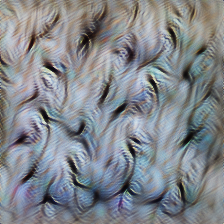
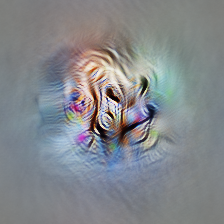

  5%|▌         | 5/100 [00:00<00:02, 44.25it/s]

27761


100%|██████████| 100/100 [00:02<00:00, 44.26it/s]



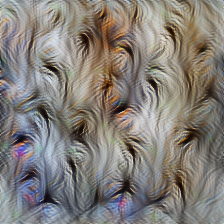
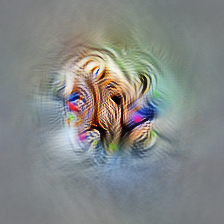

  5%|▌         | 5/100 [00:00<00:02, 44.58it/s]

36953


100%|██████████| 100/100 [00:02<00:00, 43.17it/s]



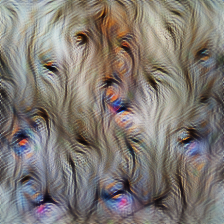
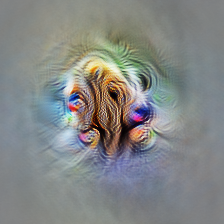

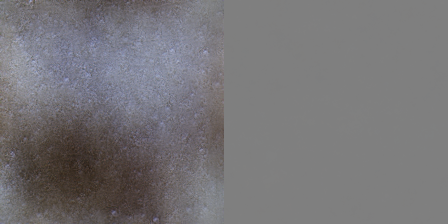

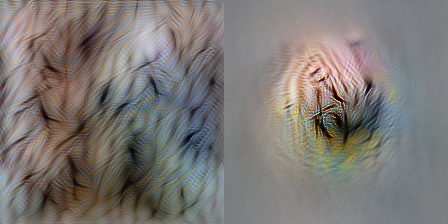

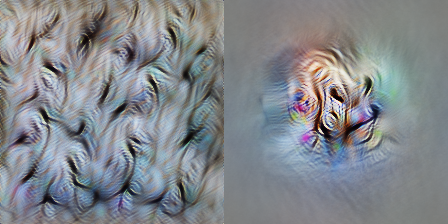

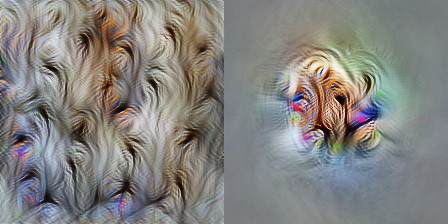

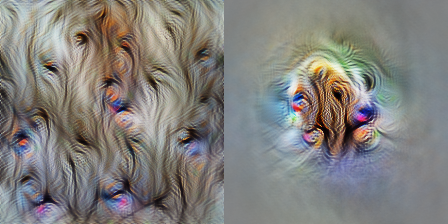

saving gif to test_linear.gif


In [34]:


image_list = gen_feature_viz_video(model,ranks,layer,unit,sparsity_range=(.001,.2),frames=5,opt_steps=100,
                            file_name='test_linear.gif',scheduler='linear',connected=True, negatives=False)



![SegmentLocal](features_10_230_linear.gif "segment")

![SegmentLocal](features_10_230_exp.gif "segment")

![SegmentLocal](features_10_230_linear.gif "segment")

![SegmentLocal](fur_100_steps.gif "segment")

![SegmentLocal](fur_phased.gif "segment")

![SegmentLocal](features_10:230__paint.gif "segment")


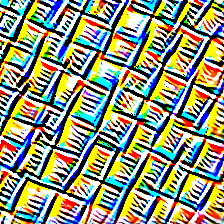

In [149]:
from lucent_video.misc.io import show

show(image_list[40][0])

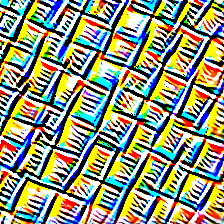

In [162]:
im = Image.fromarray(np.uint8(image_list[40][0][0]*255))
display(im)

In [164]:
from PIL import Image

name = '%s_%s_paint.gif'%(layer,unit)

gif = []
images = []#images, just convert it into PIL.Image obj
for image in image_list:
    im = im = Image.fromarray(np.uint8(image[0][0]*255))
    gif.append(im)
gif[0].save(name, save_all=True,optimize=False, append_images=gif[1:], loop=0)

In [171]:
print(name)

features_6_305_paint.gif


![SegmentLocal](features_6_305_paint.gif "segment")


![SegmentLocal](featureviz_videos/alexnet_sparse/features_10_162_linear.gif "segment")

In [ ]:
features_10_162_linear.gif  _features_3_38_linear.gif  features_3_38_linear.gif  features_8_248_linear.gif  features_8_253_linear.gif

![SegmentLocal](featureviz_videos/alexnet_sparse/features_8_248_linear.gif "segment")

![SegmentLocal](featureviz_videos/alexnet_sparse/features_8_253_linear.gif "segment")

100%|██████████| 5/5 [00:00<00:00, 53.80it/s]



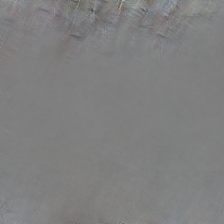

100%|██████████| 5/5 [00:00<00:00, 54.84it/s]



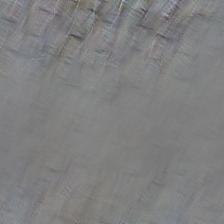

100%|██████████| 5/5 [00:00<00:00, 53.67it/s]



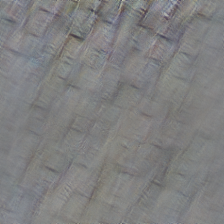

100%|██████████| 5/5 [00:00<00:00, 54.00it/s]



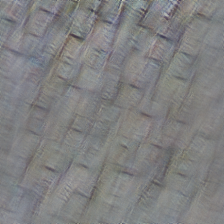

100%|██████████| 5/5 [00:00<00:00, 53.99it/s]



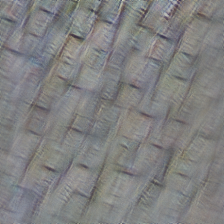

100%|██████████| 5/5 [00:00<00:00, 53.95it/s]



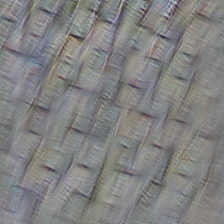

100%|██████████| 5/5 [00:00<00:00, 53.32it/s]



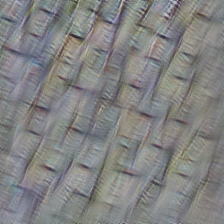

100%|██████████| 5/5 [00:00<00:00, 54.46it/s]



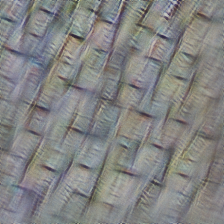

100%|██████████| 5/5 [00:00<00:00, 53.76it/s]



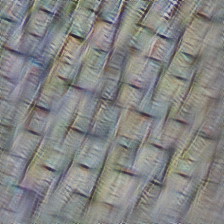

100%|██████████| 5/5 [00:00<00:00, 53.19it/s]



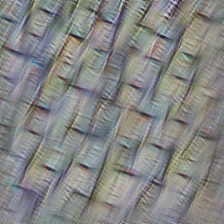

100%|██████████| 5/5 [00:00<00:00, 53.59it/s]



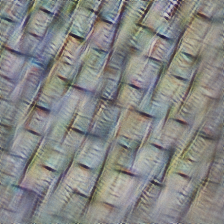

100%|██████████| 5/5 [00:00<00:00, 53.36it/s]



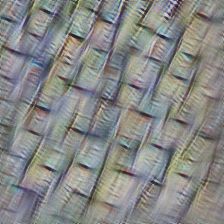

100%|██████████| 5/5 [00:00<00:00, 53.11it/s]



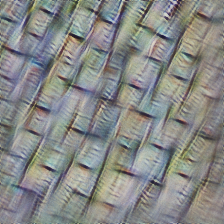

100%|██████████| 5/5 [00:00<00:00, 52.53it/s]



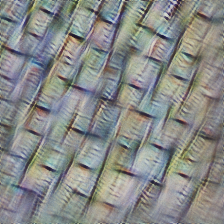

100%|██████████| 5/5 [00:00<00:00, 53.64it/s]



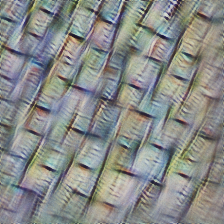

100%|██████████| 5/5 [00:00<00:00, 53.25it/s]



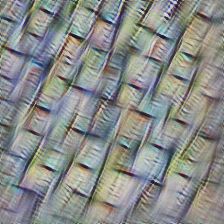

100%|██████████| 5/5 [00:00<00:00, 52.74it/s]



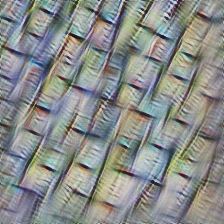

100%|██████████| 5/5 [00:00<00:00, 53.06it/s]



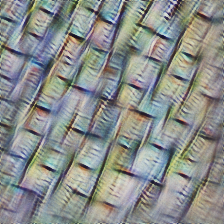

100%|██████████| 5/5 [00:00<00:00, 52.84it/s]



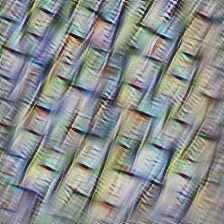

100%|██████████| 5/5 [00:00<00:00, 52.90it/s]



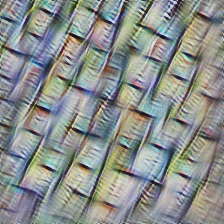

100%|██████████| 5/5 [00:00<00:00, 52.84it/s]



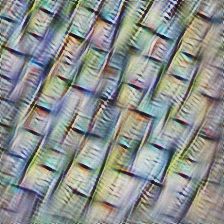

100%|██████████| 5/5 [00:00<00:00, 52.96it/s]



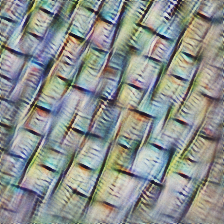

100%|██████████| 5/5 [00:00<00:00, 52.90it/s]



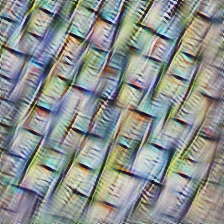

100%|██████████| 5/5 [00:00<00:00, 51.83it/s]



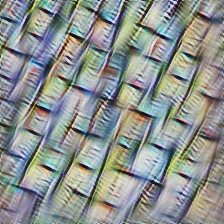

100%|██████████| 5/5 [00:00<00:00, 53.31it/s]



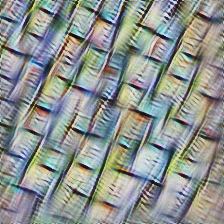

100%|██████████| 5/5 [00:00<00:00, 52.59it/s]



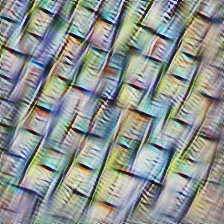

100%|██████████| 5/5 [00:00<00:00, 53.04it/s]



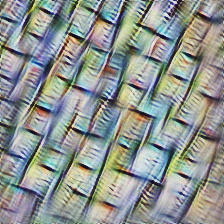

100%|██████████| 5/5 [00:00<00:00, 52.66it/s]



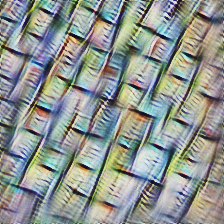

100%|██████████| 5/5 [00:00<00:00, 52.81it/s]



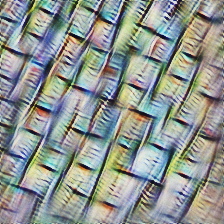

100%|██████████| 5/5 [00:00<00:00, 52.38it/s]



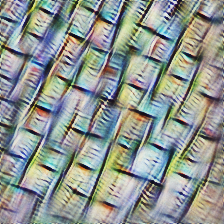

100%|██████████| 5/5 [00:00<00:00, 52.28it/s]



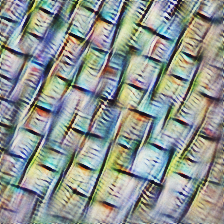

100%|██████████| 5/5 [00:00<00:00, 53.03it/s]



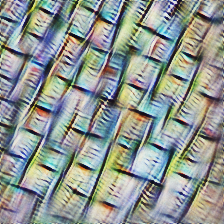

100%|██████████| 5/5 [00:00<00:00, 52.13it/s]



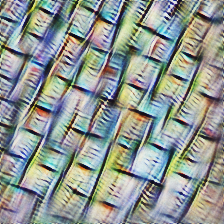

100%|██████████| 5/5 [00:00<00:00, 51.64it/s]



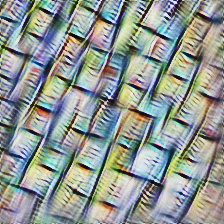

100%|██████████| 5/5 [00:00<00:00, 51.88it/s]



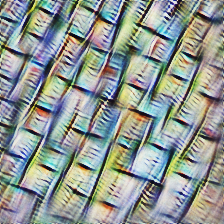

100%|██████████| 5/5 [00:00<00:00, 52.38it/s]



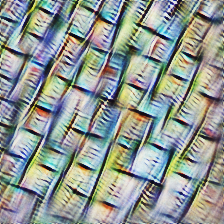

100%|██████████| 5/5 [00:00<00:00, 52.04it/s]



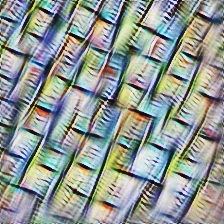

100%|██████████| 5/5 [00:00<00:00, 51.43it/s]



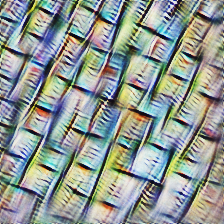

100%|██████████| 5/5 [00:00<00:00, 52.93it/s]



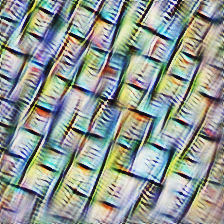

100%|██████████| 5/5 [00:00<00:00, 51.80it/s]



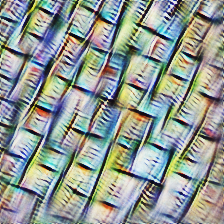

In [168]:
from lucent_video.optvis import render, param, transform, objectives
#from lucent_video.modelzoo import inceptionv1
#param_f = lambda: param.image(size)

total_viz_steps = 200
within_viz_steps = 5

image_list = []
params = None
for i in range(int(total_viz_steps/within_viz_steps)):
    param_f = lambda: param.image(224,start_params=params,magic=10)
    #param_f = lambda: param.image(224)
    image,params = render.render_vis(model, obj_c, param_f, show_inline=True, thresholds=(within_viz_steps,),return_params=True)
    image_list.append(image)


In [172]:
from PIL import Image

name = '%s_%s_render.gif'%(layer,unit)

gif = []
images = []#images, just convert it into PIL.Image obj
for image in image_list:
    im = im = Image.fromarray(np.uint8(image[0][0]*255))
    gif.append(im)
gif[0].save(name, save_all=True,optimize=False, append_images=gif[1:], loop=0)

In [173]:
print(name)

features_6_305_render.gif


In [38]:
import os
os.listdir('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner/circuit_ranks/alexnet_sparse/imagenet_2/actxgrad')

['alexnet_sparse_features_3:38_1640633096.7392142.pt',
 'alexnet_sparse_features_10:162_1640652792.3949037.pt',
 'alexnet_sparse_features_8:248_1640665713.6568484.pt',
 'alexnet_sparse_features_8:253_1640666449.1456811.pt',
 'alexnet_sparse_features_3:163_1640652815.014745.pt',
 'alexnet_sparse_features_6:214_1640660663.017306.pt',
 'alexnet_sparse_features_6:275_1640668369.0876863.pt',
 'alexnet_sparse_features_6:257_1640666919.4150696.pt',
 'alexnet_sparse_features_6:154_1640651428.9063568.pt',
 'alexnet_sparse_features_6:343_1640673838.8007421.pt',
 'alexnet_sparse_features_6:23_1640630768.8306541.pt',
 'alexnet_sparse_features_3:96_1640642233.899311.pt',
 'alexnet_sparse_features_6:205_1640659333.9058344.pt',
 'alexnet_sparse_features_8:231_1640663213.1441882.pt',
 'alexnet_sparse_features_6:373_1641779852.5307884.pt',
 'alexnet_sparse_features_6:338_1640673434.370947.pt',
 'alexnet_sparse_features_10:210_1640660175.8308594.pt',
 'alexnet_sparse_features_6:269_1640667885.5718992.pt

![SegmentLocal](features_6_305_render.gif "segment")